# Data acquisition

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os


### Caricamento file train.csv

In [2]:
file_path= "../../train.csv"
df = pd.read_csv(file_path)

In [3]:
# Visualizzazione le prime righe del dataframe
df.head() 

,Year,S0,S1,S2,S3,S4,S5,S6,S7,S8,...,S80,S81,S82,S83,S84,S85,S86,S87,S88,S89
0,2007,44.76752,114.82099,3.83239,27.99928,1.49153,-15.90853,28.24844,3.61650,-7.24653,...,-1.89619,-471.02844,411.56205,443.01198,19.30254,309.07806,-336.91706,-14.70547,-474.44157,31.32820
1,2004,52.28942,75.73319,11.35941,-6.20582,-27.64559,-30.75995,12.50955,7.47877,9.88498,...,4.57060,1.36110,-6.52977,59.48672,3.69790,-36.92252,44.08077,3.39993,-70.07591,3.86143
2,2005,33.81773,-139.07371,134.19332,17.85216,63.47408,-25.28005,-34.65911,-5.99135,1.27848,...,54.16608,15.04530,39.09107,39.03041,3.68708,-61.88547,45.68115,6.39822,3.24471,35.74749
3,1998,41.60866,3.17811,-3.97174,23.53564,-19.68553,20.74407,18.80866,6.24474,-7.98424,...,28.08591,295.88684,54.02395,102.02880,40.47711,15.10258,-250.32293,2.81288,56.05172,3.60432
4,1987,44.49525,-32.25270,58.08217,3.73684,-32.53274,-18.72885,-15.85665,-3.34607,22.63786,...,31.44988,-136.50457,-85.11989,-74.96342,9.56921,-100.61689,-133.29315,9.19246,-97.37953,30.11015


In [4]:
# Dimensione del dataframe
print("Dimensionu del dataframe \n")
print("Righe: " + str(len(df.index)))
print("Colonne: " + str(len(df.columns)))

Dimensionu del dataframe 

Righe: 252175
Colonne: 91


# Data Visualization

### Distribuzione delle canzoni per anno di pubblicazione 


Distribuzione delle canzoni per anno di pubblicazione:
Year
1956      283
1957      299
1958      291
1959      296
1960      212
1961      285
1962      302
1963      451
1964      473
1965      560
1966      689
1967      859
1968      934
1969     1105
1970     1174
1971     1065
1972     1144
1973     1298
1974     1092
1975     1241
1976     1089
1977     1251
1978     1463
1979     1554
1980     1551
1981     1581
1982     1798
1983     1693
1984     1684
1985     1789
1986     2110
1987     2561
1988     2805
1989     3335
1990     3628
1991     4323
1992     4771
1993     5263
1994     6061
1995     6629
1996     7065
1997     7591
1998     7907
1999     9119
2000     9642
2001    10795
2002    11726
2003    13691
2004    14803
2005    17476
2006    18767
2007    19702
2008    17380
2009    15519
Name: count, dtype: int64


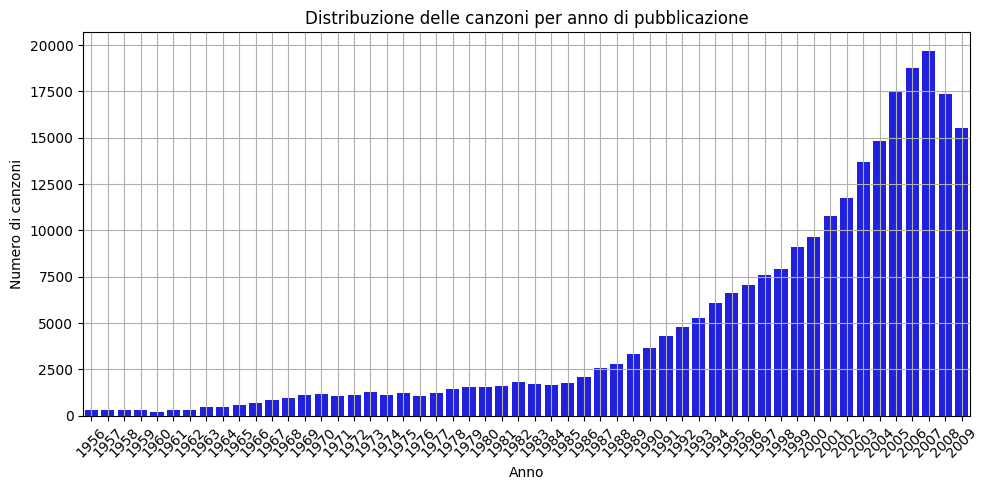

In [5]:
# Calcola la frequenza di canzoni per anno
year_distribution = df['Year'].value_counts().sort_index()

print("\nDistribuzione delle canzoni per anno di pubblicazione:")
print(year_distribution)

plt.figure(figsize=(10, 5)) 
sns.barplot(x=year_distribution.index, y=year_distribution.values, color='blue') 
plt.title('Distribuzione delle canzoni per anno di pubblicazione')
plt.xlabel('Anno')
plt.ylabel('Numero di canzoni')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()  
plt.show()

### Divisione in decenni e numero di features

In [6]:
# Definisci i decenni come intervalli
decade_bins = list(range(1950, 2021, 10))
decade_labels = [f'{dec}-{dec+9}' for dec in decade_bins[:-1]]

# Aggiungi una colonna 'DecadeGroup' al DataFrame
df['DecadeGroup'] = pd.cut(df['Year'], bins=decade_bins, labels=decade_labels, include_lowest=True)

# Calcola il numero di canzoni per ogni 'DecadeGroup' usando 'value_counts'
decade_counts = df['DecadeGroup'].value_counts().sort_index()

# Crea un DataFrame ordinato con i risultati
decade_distribution_df = pd.DataFrame({
    'Decade': decade_counts.index,
    'Number of Songs': decade_counts.values
})

print("Distribuzione delle canzoni per decennio:")
print(decade_distribution_df)

Distribuzione delle canzoni per decennio:
      Decade  Number of Songs
0  1950-1959             1381
1  1960-1969             6832
2  1970-1979            12748
3  1980-1989            22984
4  1990-1999            68371
5  2000-2009           139859
6  2010-2019                0


### Density plot delle features per decenni

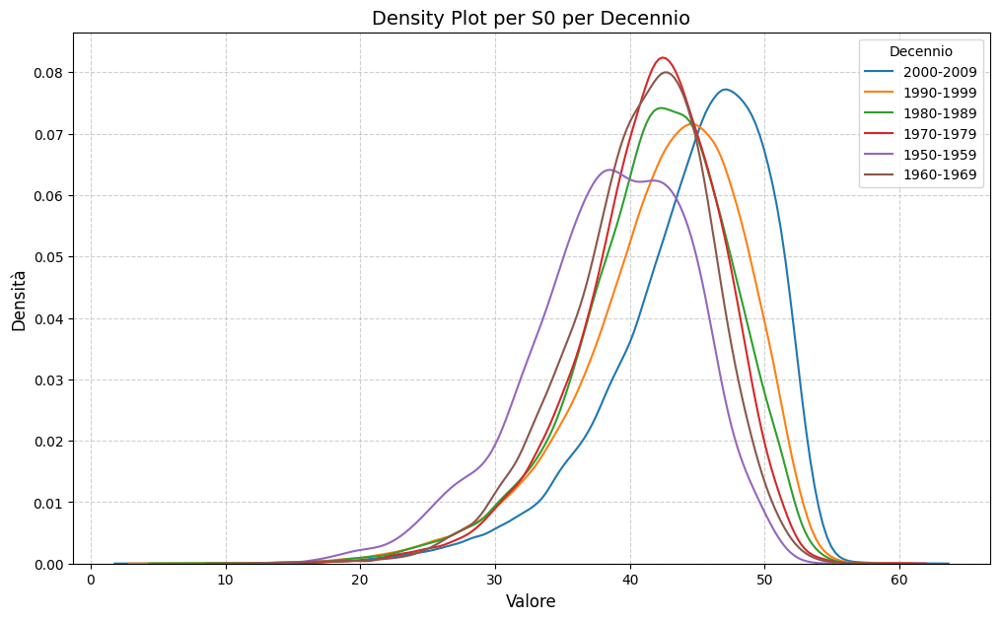

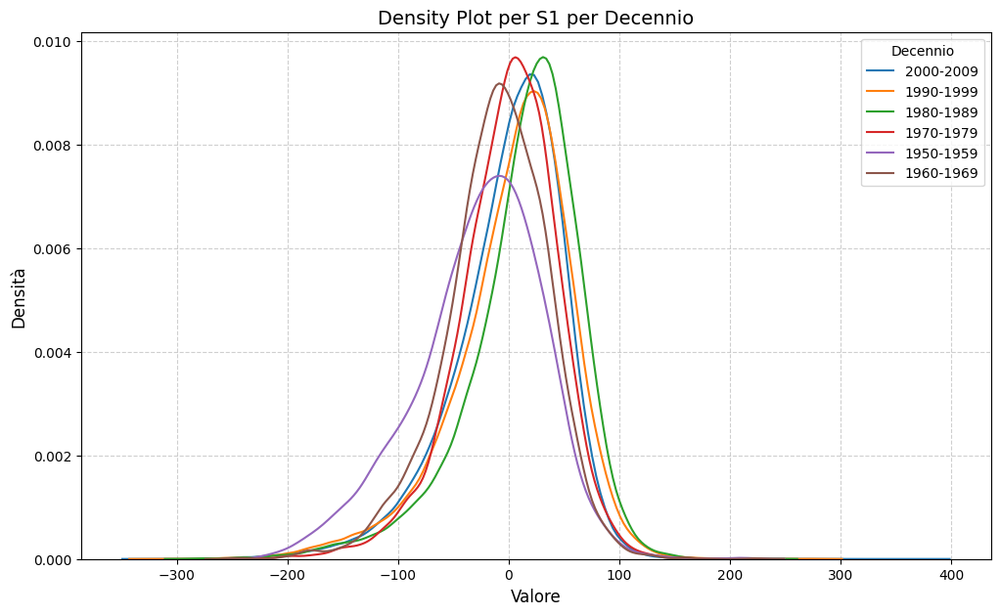

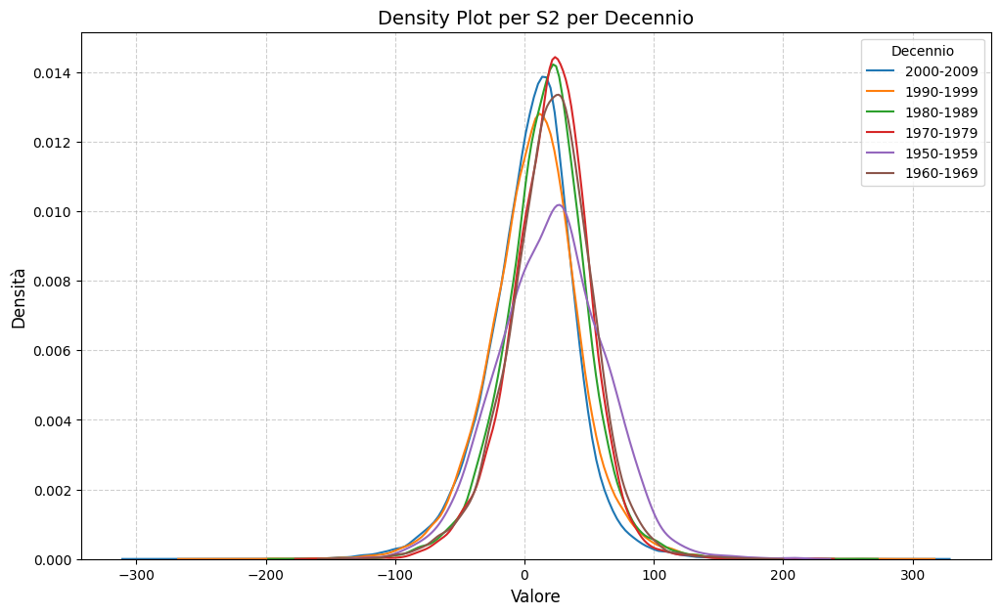

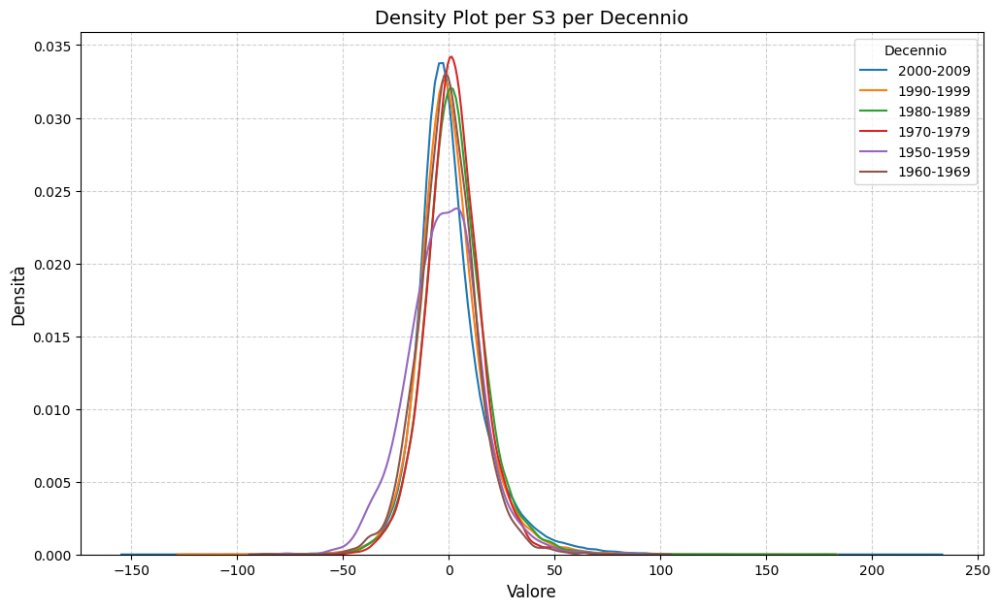

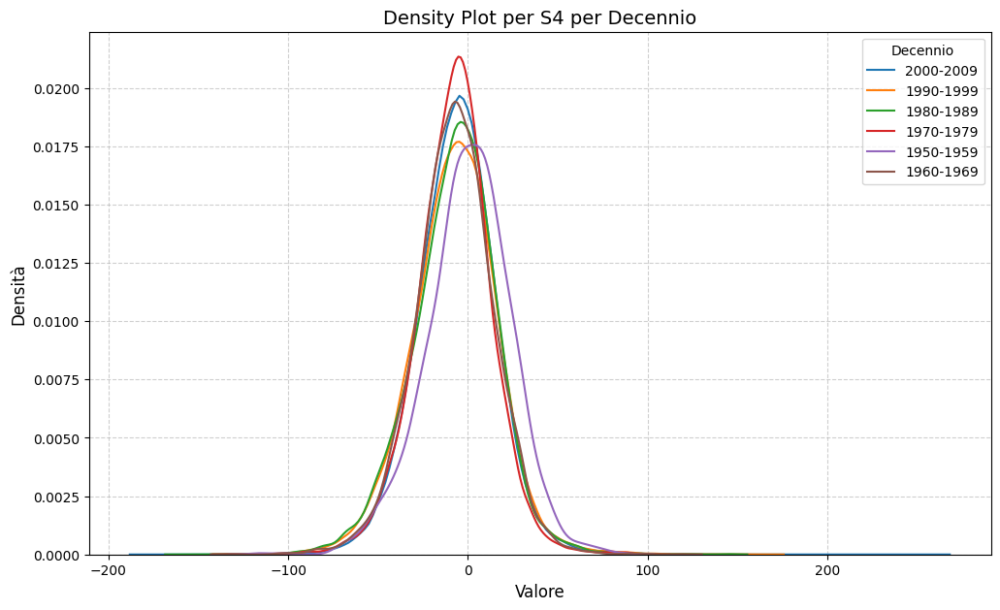

...

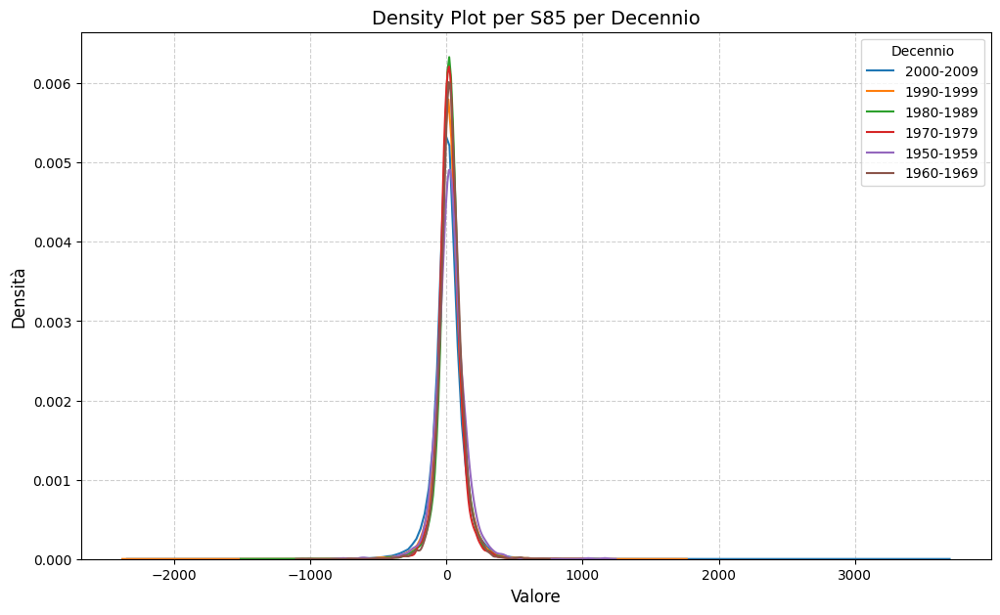

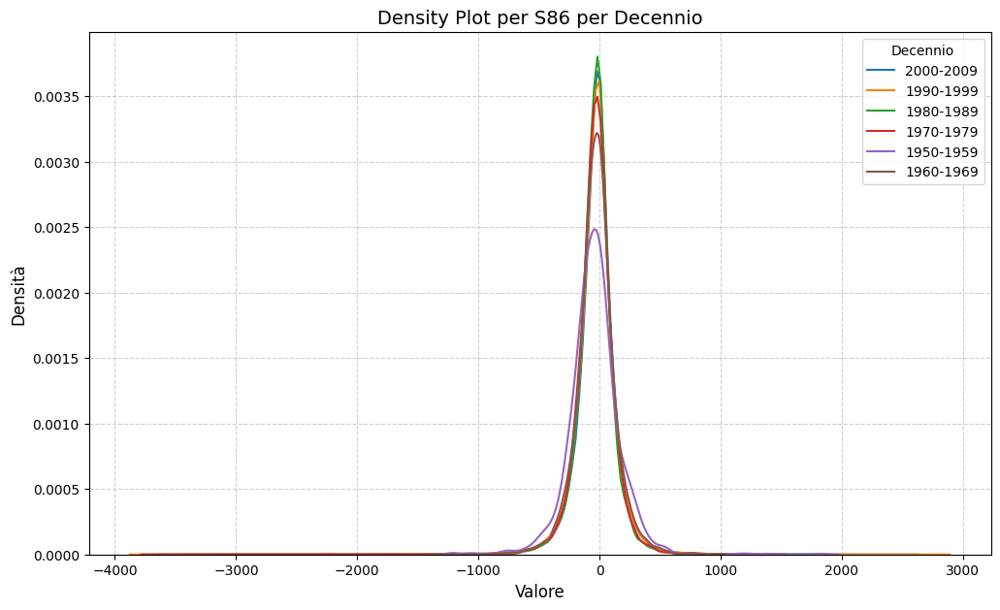

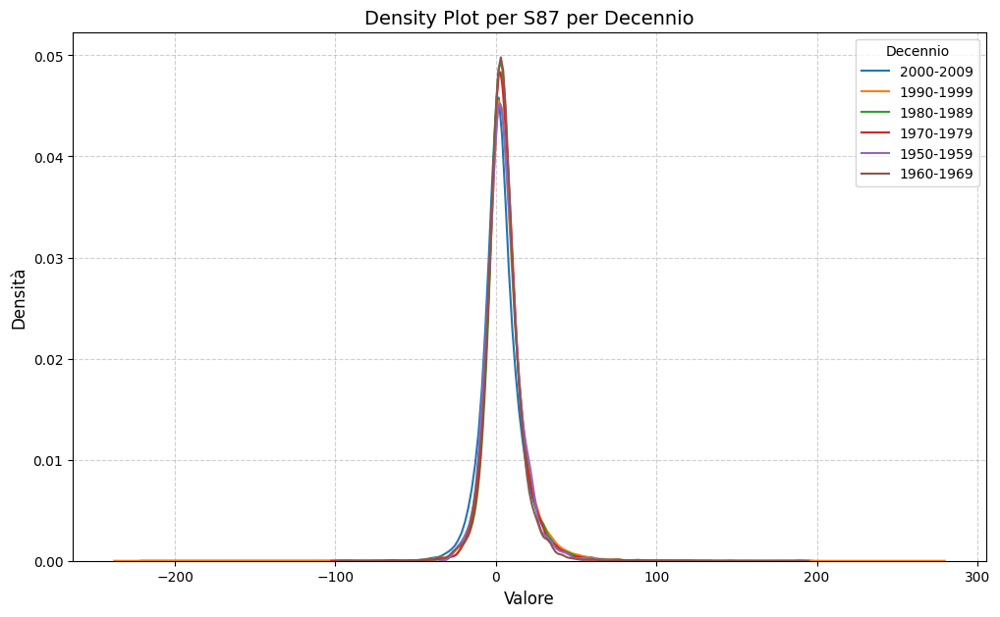

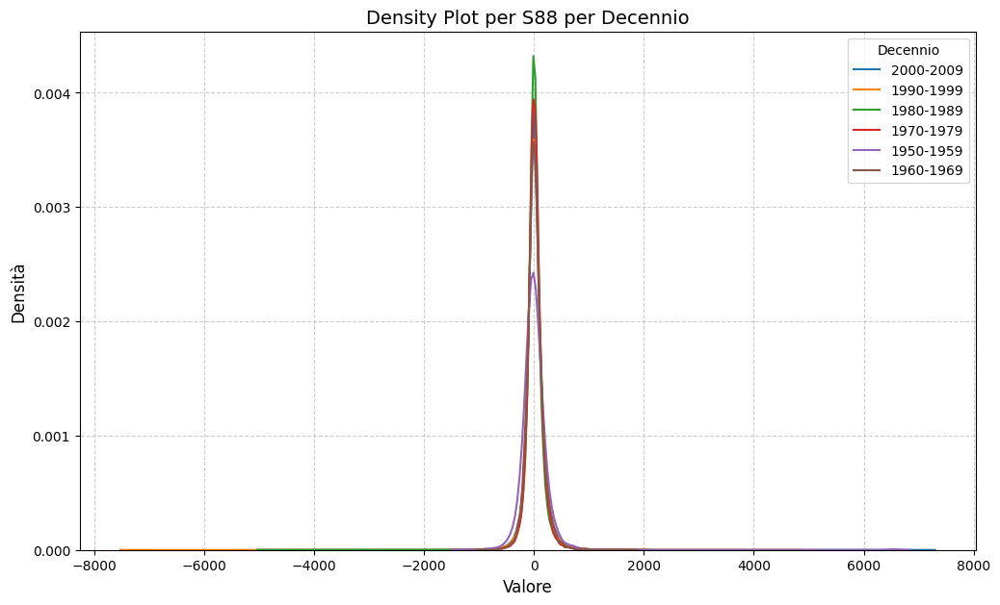

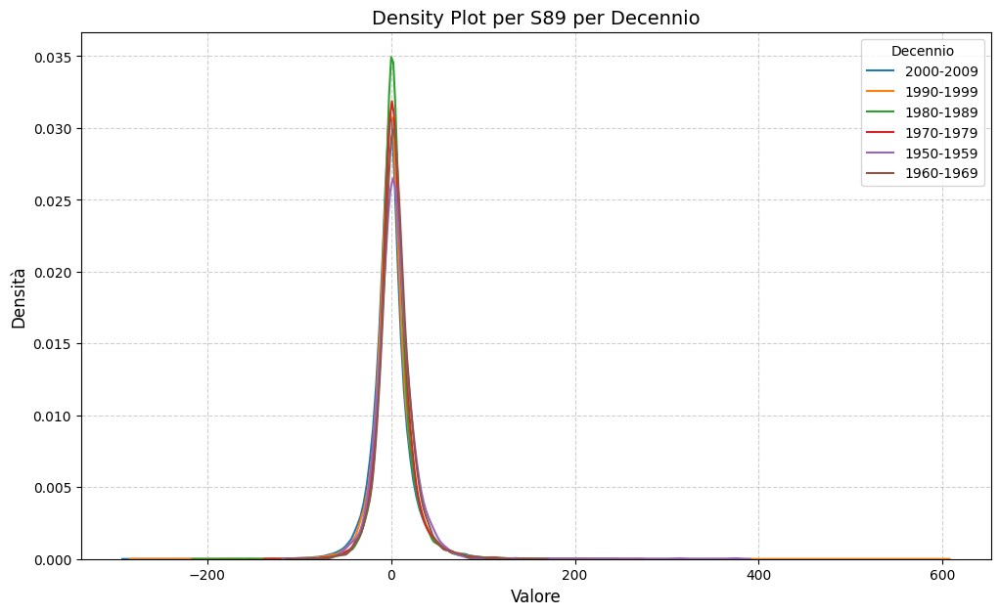

In [7]:


# Dizionario per raggruppare i dati per decennio
decades_dict = {}
for label in df['DecadeGroup'].unique():
    decades_dict[label] = df[df['DecadeGroup'] == label]

# Itera sulle colonne del DataFrame (tranne "Year" e "DecadeGroup")
for column in df.columns:
    if column not in ['Year', 'DecadeGroup']:
        plt.figure(figsize=(12, 7))

        # Traccia una curva di densità per ogni decennio
        for label, data in decades_dict.items():
            sns.kdeplot(data[column], label=label, linewidth=1.5)

        plt.title(f'Density Plot per {column} per Decennio', fontsize=14)
        plt.xlabel('Valore', fontsize=12)
        plt.ylabel('Densità', fontsize=12)
        plt.legend(title='Decennio')
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.show()


### Boxplot

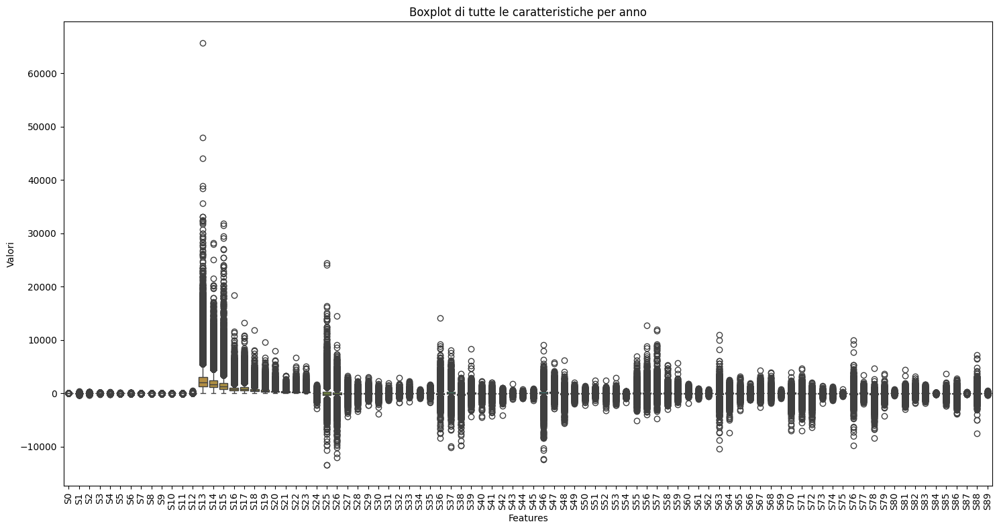

In [13]:
# Boxplot per ogni feature, raggruppando per anno
plt.figure(figsize=(15, 8))
sns.boxplot(data=df.drop(columns=['Year', 'DecadeGroup']), orient='v')  # boxplot verticale
plt.xticks(rotation=90) 
plt.xlabel('Features')
plt.ylabel('Valori')
plt.title('Boxplot di tutte le caratteristiche per anno')
plt.tight_layout()
plt.show()

# GABRIELE FA ANCHE QUESTO, VOGLIAMO FARLO????

In [9]:
# DA MODIFICAREEEEE

'''

#Box plot per ciascuna colonna
num_cols = 4  # Numero di colonne per riga
num_rows = (no_target_column_data.iloc[:,:].shape[1] + num_cols - 1) // num_cols  # Calcola il numero di righe necessario

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5))
axes = axes.flatten()  # Appiattisci gli assi per facilitare l'iterazione

for i, col in enumerate(no_target_column_data.iloc[:,:].columns):
    sns.boxplot(data=no_target_column_data, y=col, ax=axes[i])
    axes[i].set_title(f'Box Plot: {col}')
    axes[i].set_xlabel('')  # Rimuovi l'etichetta dell'asse x
    axes[i].set_ylabel('Values')
    axes[i].set_xticks([])  # Rimuovi i tick dell'asse x

# Nascondi gli assi inutilizzati
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

'''

"\n\n#Box plot per ciascuna colonna\nnum_cols = 4  # Numero di colonne per riga\nnum_rows = (no_target_column_data.iloc[:,:].shape[1] + num_cols - 1) // num_cols  # Calcola il numero di righe necessario\n\nfig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5))\naxes = axes.flatten()  # Appiattisci gli assi per facilitare l'iterazione\n\nfor i, col in enumerate(no_target_column_data.iloc[:,:].columns):\n    sns.boxplot(data=no_target_column_data, y=col, ax=axes[i])\n    axes[i].set_title(f'Box Plot: {col}')\n    axes[i].set_xlabel('')  # Rimuovi l'etichetta dell'asse x\n    axes[i].set_ylabel('Values')\n    axes[i].set_xticks([])  # Rimuovi i tick dell'asse x\n\n# Nascondi gli assi inutilizzati\nfor j in range(i + 1, len(axes)):\n    fig.delaxes(axes[j])\n\nplt.tight_layout()\nplt.show()\n\n"

### Outliers

In [18]:
# Seleziona solo le colonne che iniziano con 'S'
colonne_s = [col for col in df.columns if col.startswith('S')]

# Lista per memorizzare i risultati
risultati_outliers = []

# Ciclo attraverso ogni colonna 'S'
for col in colonne_s:
    # Calcola i quantili e l'IQR (Interquartile Range)
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    
    # Calcola i baffi inferiori e superiori
    baffo_inferiore = q1 - 1.5 * iqr
    baffo_superiore = q3 + 1.5 * iqr
    
    # Trova gli outliers inferiori e superiori
    outliers_inferiori = df[df[col] < baffo_inferiore]
    outliers_superiori = df[df[col] > baffo_superiore]
    numero_outliers = len(outliers_inferiori) + len(outliers_superiori)
    
    # Calcola la percentuale di outliers
    percentuale_outliers = (numero_outliers / len(df)) * 100
    
    # Aggiungi i risultati alla lista
    risultati_outliers.append({
        'Colonna': col,
        'Numero Outliers': numero_outliers,
        'Percentuale Outliers': percentuale_outliers
    })

# Converti i risultati in un DataFrame e stampalo
df_outliers = pd.DataFrame(risultati_outliers)
print(df_outliers)

   Colonna  Numero Outliers  Percentuale Outliers
0       S0             5306              2.104094
1       S1             7313              2.899970
2       S2             7484              2.967780
3       S3            11229              4.452860
4       S4             5224              2.071577
..     ...              ...                   ...
85     S85            16608              6.585903
86     S86            15876              6.295628
87     S87            14794              5.866561
88     S88            19031              7.546743
89     S89            19330              7.665312

[90 rows x 3 columns]


### Matrice di correlazione

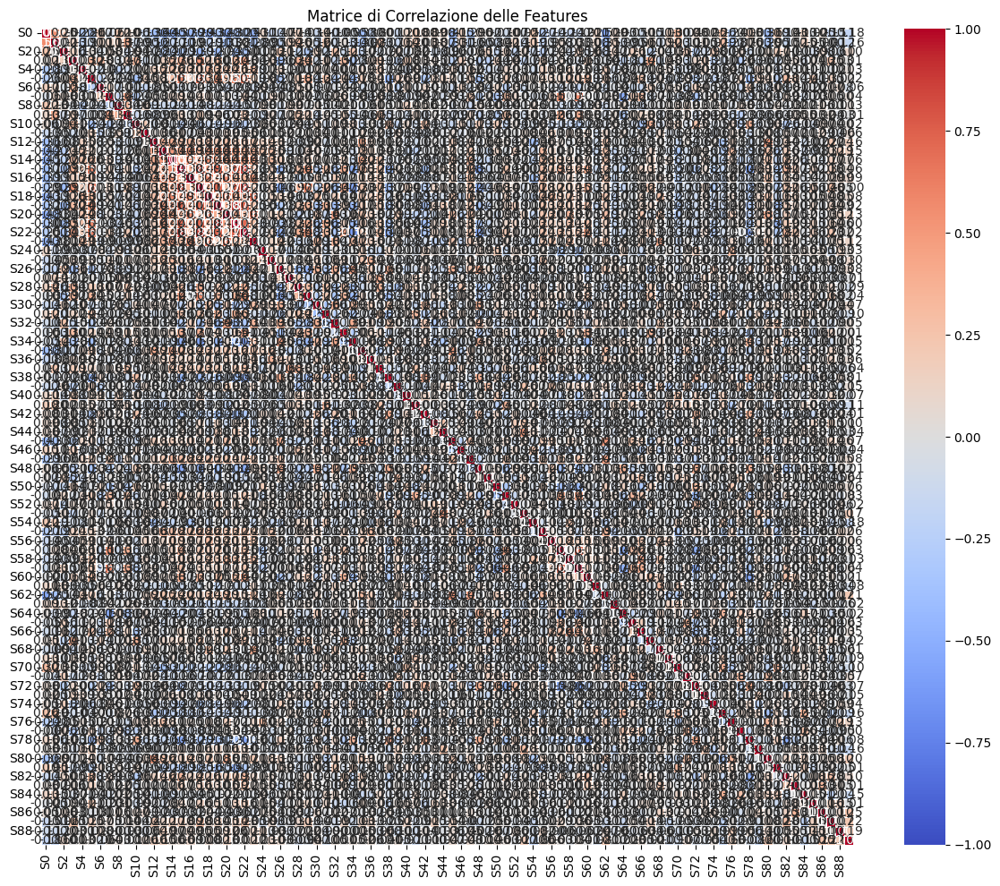

In [11]:
# Calcola la matrice di correlazione
correlation_matrix = df.drop(columns=['Year', 'DecadeGroup']).corr()

# Crea una heatmap della matrice di correlazione
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, vmin=-1, vmax=1)
plt.title('Matrice di Correlazione delle Features')
plt.tight_layout()
plt.show()

### Media delle features per ciascun anno

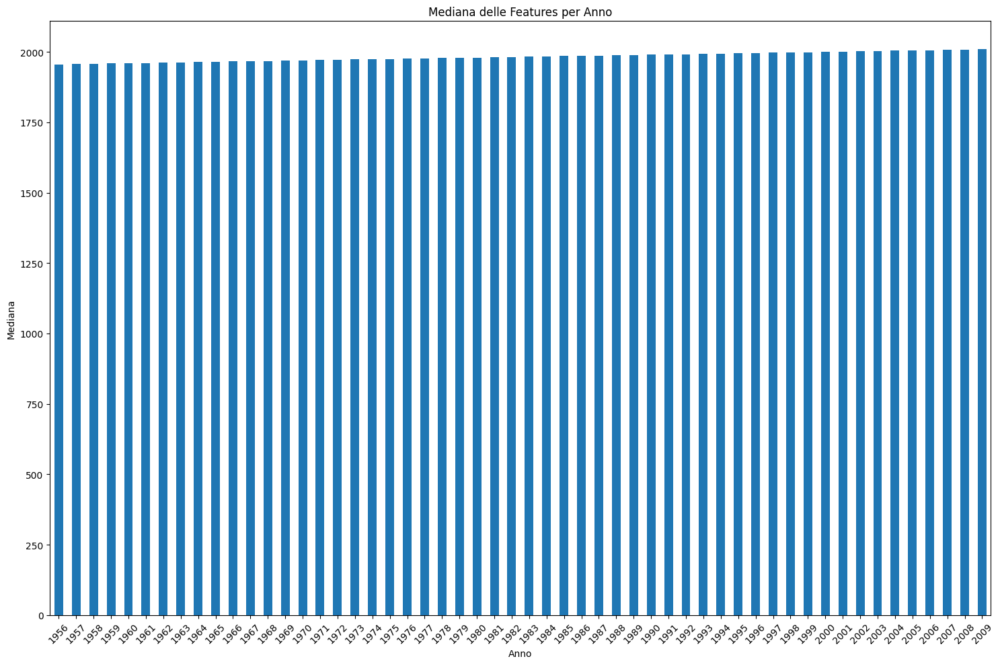

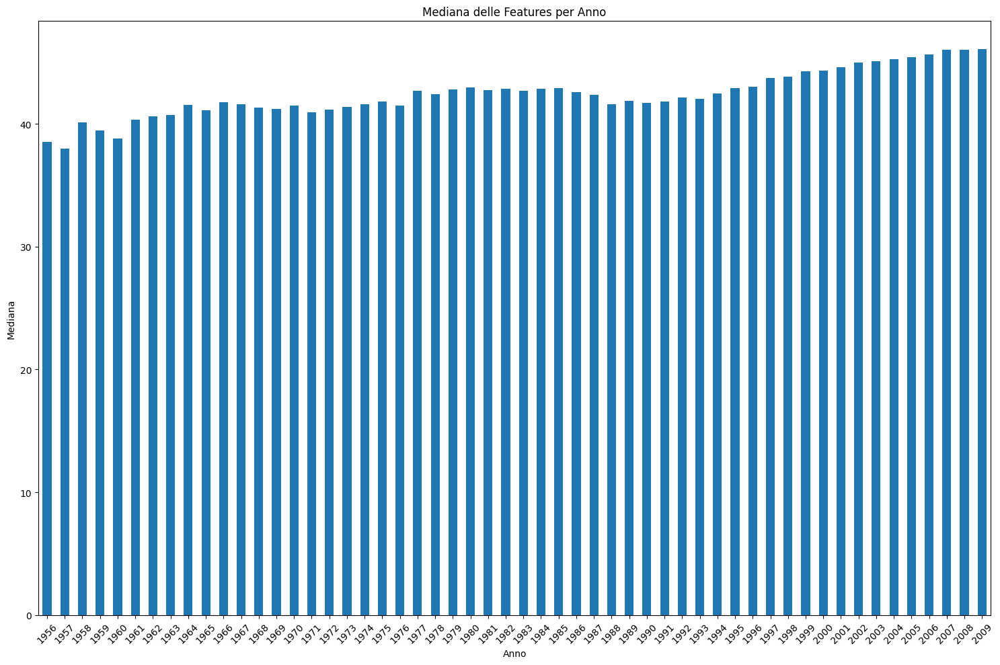

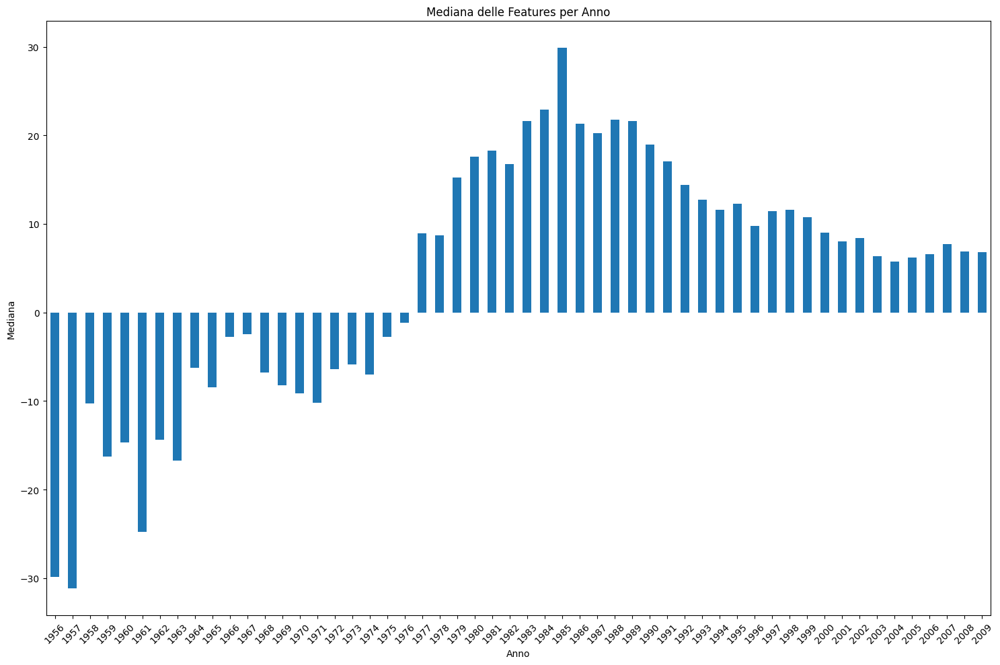

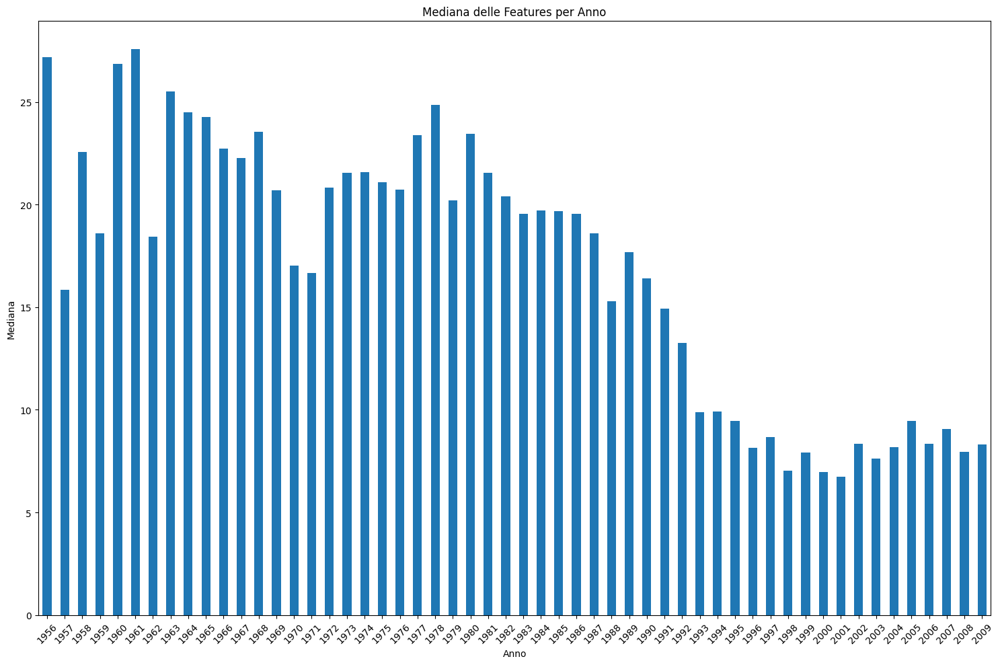

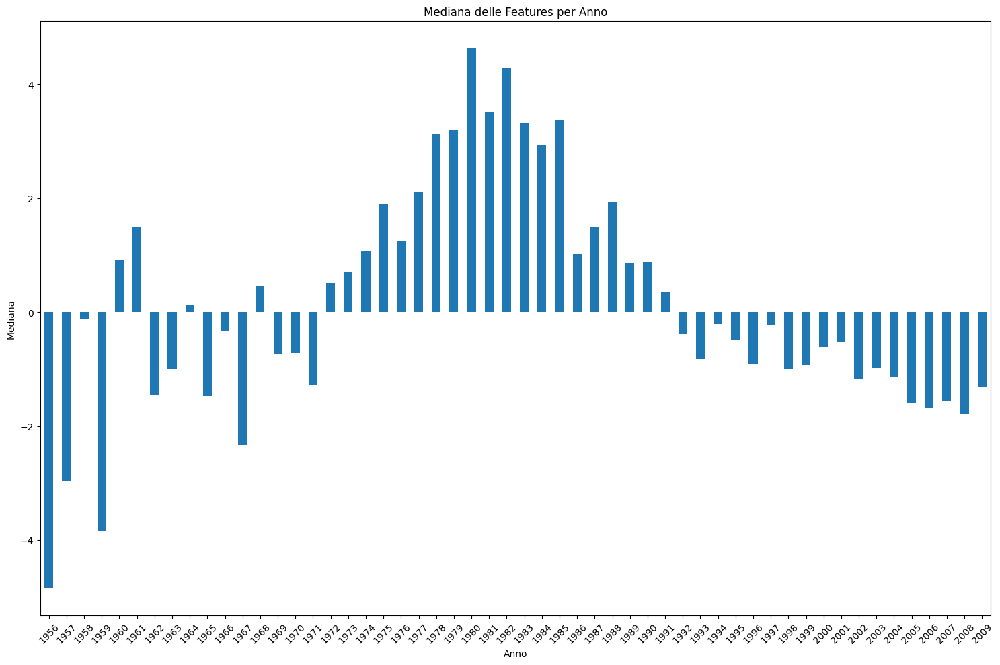

...

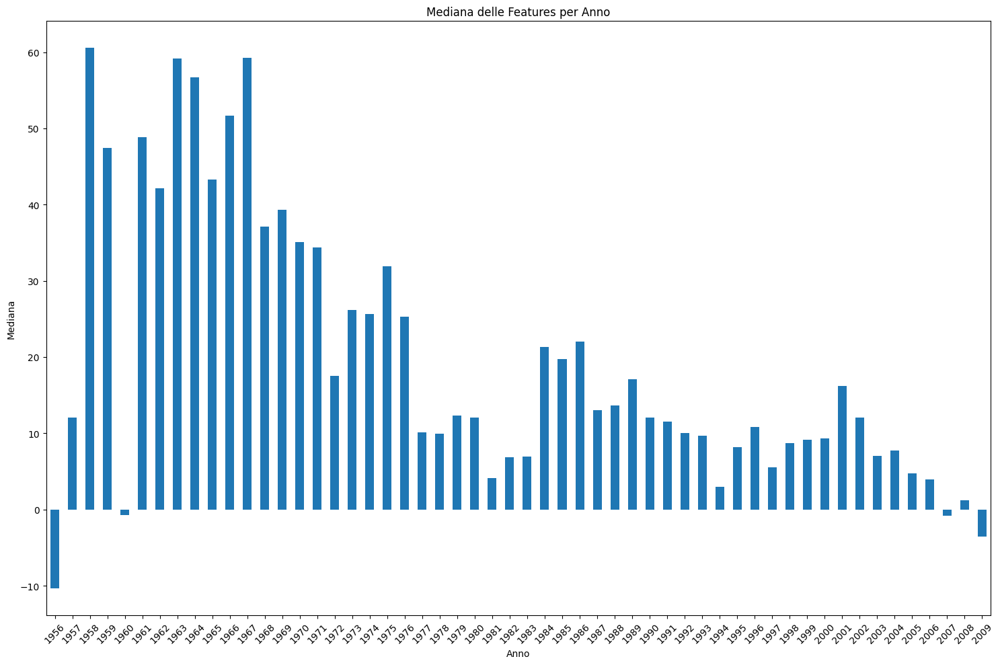

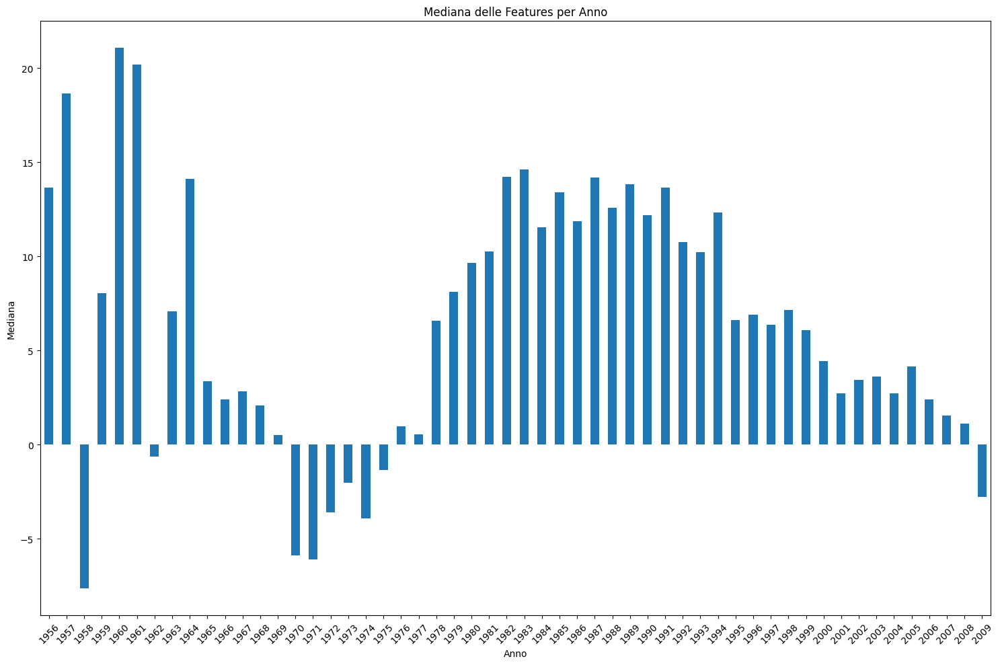

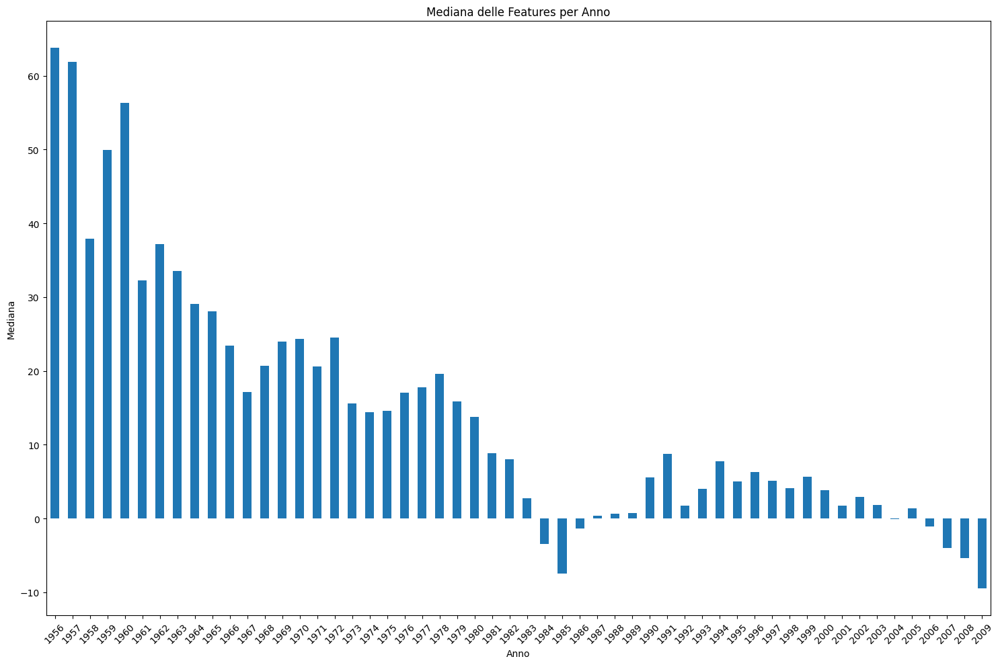

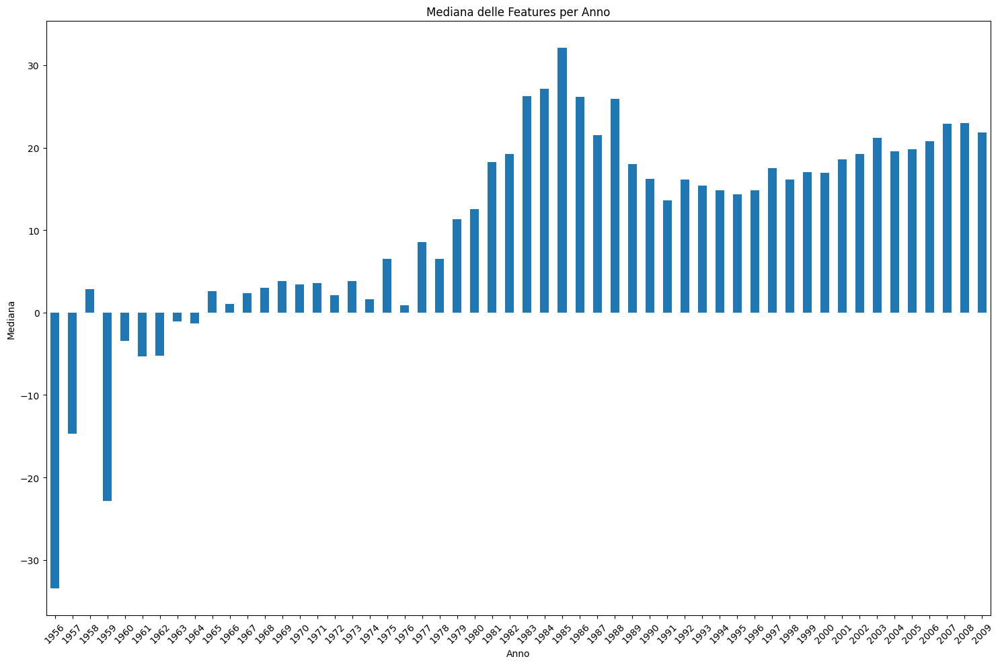

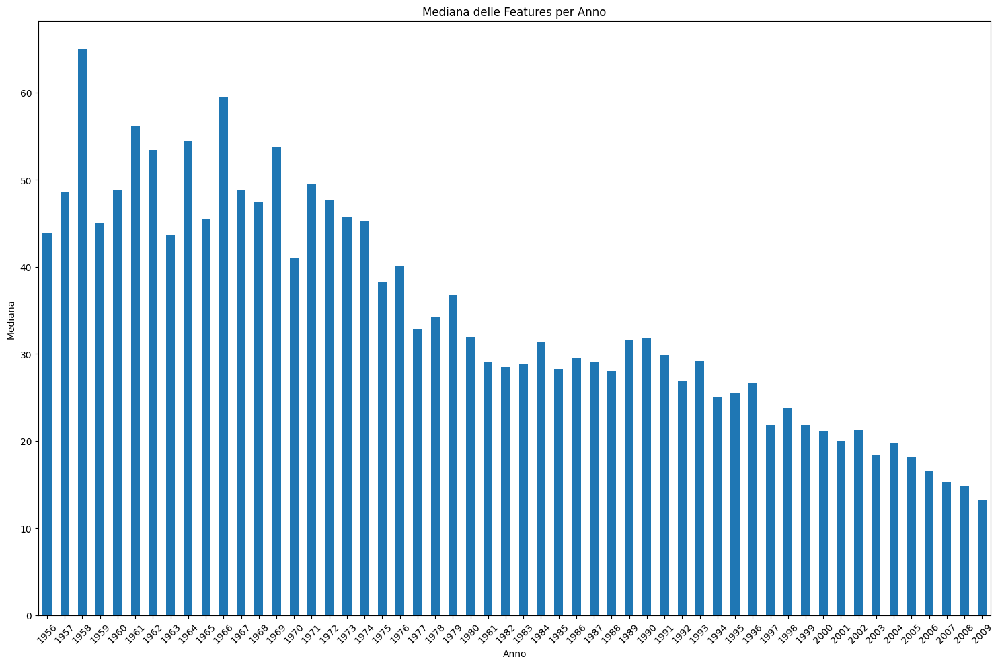

KeyboardInterrupt: 

In [31]:
# Creazione di una cartella per salvare i grafici
output_dir = 'output_plots_median_year'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Lista delle caratteristiche da analizzare, escludendo la colonna 'Year'
features = df.columns[1:]  # Esclude la prima colonna 'Year'

features = df.select_dtypes(include=['number']).columns # Solo le colonne numeriche escludendo 'Year' e 'DecadeGroup'


# Calcolo e tracciamento della mediana per ogni feature
for feature in features:
    median_year = df.groupby('Year')[feature].median()

    plt.figure(figsize=(8, 6))
    plt.plot(median_year.index, median_year.values, marker='o', linestyle='-') # Plot delle mediane per anno delle features
    plt.title(f'Median of {feature} per Year')
    plt.xlabel('Year')
    plt.ylabel(f'Median of {feature}')
    plt.grid(True)
    plt.tight_layout()

    # Salvataggio del grafico
    plt.savefig(os.path.join(output_dir, f'Median_{feature}.png'))
    plt.close()
    
    # Crea un grafico per la mediana
    plt.figure(figsize=(15, 10))
    median_year.plot(kind='bar', figsize=(15, 10))
    plt.title('Mediana delle Features per Anno')
    plt.xlabel('Anno')
    plt.ylabel('Mediana')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

### Mediana delle features per ciascun anno

In [ ]:
# Calcola la media per ciascun anno e per ciascuna feature
mean_per_year = df.groupby('Year').mean()

# Crea un grafico per la media
plt.figure(figsize=(15, 10))
mean_per_year.plot(kind='bar', figsize=(15, 10))
plt.title('Media delle Features per Anno')
plt.xlabel('Anno')
plt.ylabel('Media')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

TypeError: category dtype does not support aggregation 'mean'